In [1]:
#Lets have matplotlib "inline"
%matplotlib inline
#%config InlineBackend.figure_format = 'retina'

#Import packages we need
import numpy as np
from netCDF4 import Dataset
from matplotlib import animation, rc
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import Normalize

#Set large figure sizes
plt.rcParams["animation.html"] = "jshtml"

In [2]:
import os
import sys

sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '../')))

from SWESimulators import FBL, CTCS, KP07, CDKLM16, PlotHelper, Common, WindStress, IPythonMagic

In [3]:
%setup_logging -o bc_test.log
%cuda_context_handler gpu_ctx

Console logger using level INFO
File logger using level DEBUG to bc_test.log
Python version 3.6.8 |Anaconda custom (64-bit)| (default, Feb 21 2019, 18:30:04) [MSC v.1916 64 bit (AMD64)]
Registering gpu_ctx in user workspace
PyCUDA version 2018.1.1
CUDA version (10, 0, 0)
Driver version 10000
Using 'GeForce 840M' GPU
Created context handle <296392158368>


In [4]:
def printInfo(url):
    with Dataset(url) as ncfile:
        print("Variables")
        for var in ncfile.variables:
            print(var)

        print ("Attributes:")    
        for attr in ncfile.ncattrs():
            print(attr, ": ", ncfile.getncattr(attr))

In [5]:
def sim_animation(simulator, t_end, T=100, \
                 h_min=-1.5, h_max=1.5, \
                 uv_min=-0.05, uv_max=0.05,
                 interior_domain_only=True,
                 add_extra=False):
    eta1, u1, v1 = sim.download(interior_domain_only=interior_domain_only)
    Hi, Hm = sim.downloadBathymetry(interior_domain_only=interior_domain_only)
    
    
    def genVelocity(rho, rho_u, rho_v):
        u = rho_u / rho
        v = rho_v / rho
        u = np.sqrt(u**2 + v**2)

        return u


    def genVorticity(rho, rho_u, rho_v):
        u = rho_u / rho
        v = rho_v / rho
        u = np.sqrt(u**2 + v**2)
        u_max = u.max()

        du_dy, _ = np.gradient(u)
        _, dv_dx = np.gradient(v)

        #Length of curl
        curl = dv_dx - du_dy
        return curl


    def genColors(rho, rho_u, rho_v, cmap, vmin, vmax):
        curl = genVorticity(rho, rho_u, rho_v)

        colors = Normalize(vmin, vmax, clip=True)(curl)
        colors = cmap(colors)

        return colors
    
    
    #Create figure and plot initial conditions
    fig = plt.figure(figsize=(12, 8))
    domain_extent = [0, sim.nx*sim.dx, 0, sim.ny*sim.dy]
    
    x_plots = 3
    y_plots = 1
    if (add_extra == True):
        x_plots=3
        y_plots=2
    
    ax_eta = plt.subplot(y_plots, x_plots, 1)
    sp_eta = ax_eta.imshow(eta1, interpolation="none", origin='bottom', cmap=plt.cm.coolwarm, vmin=h_min, vmax=h_max, extent=domain_extent)
    
    ax_u = plt.subplot(y_plots, x_plots, 2)
    sp_u = ax_u.imshow(u1, interpolation="none", origin='bottom', cmap=plt.cm.coolwarm, vmin=uv_min, vmax=uv_max, extent=domain_extent)
    
    ax_v = plt.subplot(y_plots, x_plots, 3)
    sp_v = ax_v.imshow(v1, interpolation="none", origin='bottom', cmap=plt.cm.coolwarm, vmin=uv_min, vmax=uv_max, extent=domain_extent)
    
    if (add_extra == True):
        V_max = 3 * (uv_max-uv_min) / np.max(Hm)
        ax_V = plt.subplot(y_plots, x_plots, 4)
        V = genVelocity(Hm+eta1, u1, v1)
        sp_V = ax_V.imshow(V, interpolation="none", origin='bottom', cmap=plt.cm.Oranges, vmin=0, vmax=V_max, extent=domain_extent)

        R_min = -V_max/5
        R_max = V_max/5
        ax_R = plt.subplot(y_plots, x_plots, 5)
        R = genColors(Hm+eta1, u1, v1, plt.cm.seismic, R_min, R_max)
        sp_R = ax_R.imshow(R, interpolation="none", origin='bottom', extent=domain_extent)
    
    t_per_plot = t_end / T
    
    
    #Helper function which simulates and plots the solution
    def animate(i):
        if (i>0):
            t = sim.step(t_per_plot)
        else:
            t = 0.0
        eta1, u1, v1 = sim.download(interior_domain_only=interior_domain_only)
        
        #Update plots
        fig.sca(ax_eta)
        sp_eta.set_data(eta1)
        
        fig.sca(ax_u)
        sp_u.set_data(u1)
        
        fig.sca(ax_v)
        sp_v.set_data(v1)
        
        if (add_extra == True):
            fig.sca(ax_V)
            V = genVelocity(Hm+eta1, u1, v1)
            sp_V.set_data(V)

            fig.sca(ax_R)
            R = genColors(Hm+eta1, u1, v1, plt.cm.seismic, uv_min, uv_max)
            sp_R.set_data(R)
        
        fig.suptitle("Time = {:04.0f} s ({:s})".format(t, sim.__class__.__name__), fontsize=18)
        print(".", end='')

    #Matplotlib for creating an animation
    anim = animation.FuncAnimation(fig, animate, range(T), interval=100)
    plt.close(fig)
    return anim

In [8]:
nordic4km_url = 'http://thredds.met.no/thredds/dodsC/fou-hi/nordic4km-1h/Nordic-4km_SURF_1h_avg_00.nc'
norkyst800_url = 'https://thredds.met.no/thredds/dodsC/fou-hi/norkyst800m-1h/NorKyst-800m_ZDEPTHS_his.an.2019070900.nc'

source_url = norkyst800_url

In [9]:
printInfo(source_url)

Variables
Cs_r
Cs_w
X
Y
depth
forecast_reference_time
hc
projection_stere
time
AKs
Uwind
Vwind
angle
h
lat
lon
salinity
temperature
tke
u
u_eastward
ubar
v
v_northward
vbar
w
zeta
Attributes:
file :  /home/metno_op/run/norkyst-800m_2017/ocean_his.nc
type :  ROMS/TOMS history file
title :  NorKyst-800m - ROMS
var_info :  /home/metno_op/sea/ROMS/metroms/apps/common/include/varinfo.dat_NCatm
rst_file :  /home/metno_op/run/norkyst-800m_2017/ocean_rst.nc
his_file :  /home/metno_op/run/norkyst-800m_2017/ocean_his.nc
avg_file :  /home/metno_op/run/norkyst-800m_2017/ocean_avg.nc
grd_file :  /home/metno_op/sea/ROMS/metroms_apps/norkyst-800m_2017/grid/NK800_grd.nc
ini_file :  /home/metno_op/run/norkyst-800m_2017/ocean_ini.nc
frc_file_01 :  /home/metno_op/run/norkyst-800m_2017/tide.nc
frc_file_02 :  /home/metno_op/run/norkyst-800m_2017/ocean_force.nc
bry_file :  /home/metno_op/run/norkyst-800m_2017/norkyst_bry.nc
clm_file :  /home/metno_op/run/norkyst-800m_2017/norkyst_clm.nc
nud_file :  /home/me

In [10]:
with Dataset(source_url) as ncfile:
    H_full = np.array(ncfile.variables['h'])
    print(H_full.shape)

(902, 2602)


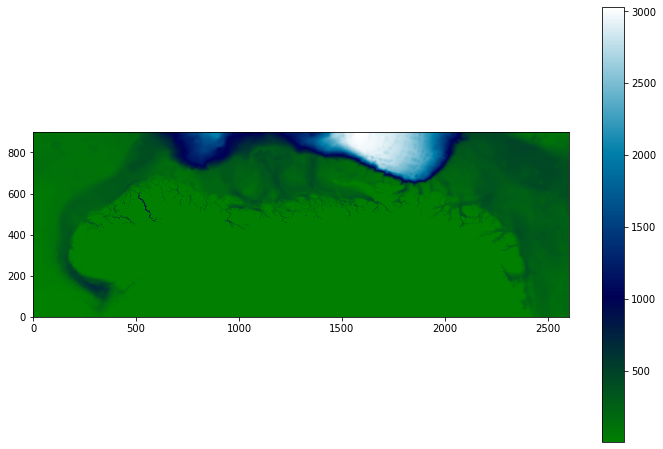

In [11]:
fig = plt.figure(figsize=(12,8))
plt.imshow(H_full, interpolation="None", origin='lower', cmap='ocean')
plt.colorbar()

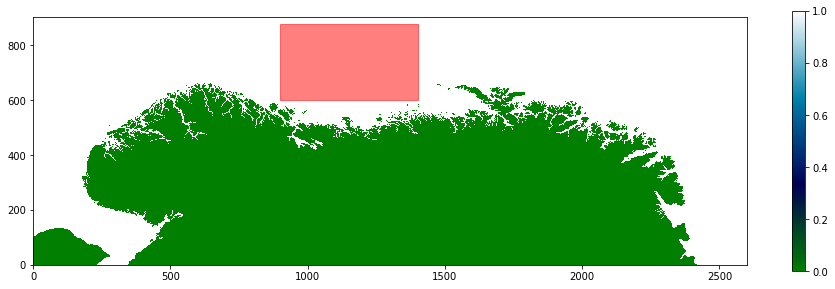

In [12]:
x0 = 900
x1 = 1400
y0 = 600
y1 = 875

fig = plt.figure(figsize=(16,12))
land = np.where(H_full > 15, 1.0, 0.0)
fig.gca().fill([x0, x0, x1, x1], [y0, y1, y1, y0], fill=True, linestyle='-', color='red', alpha=0.5)
plt.imshow(land, interpolation="None", origin='lower', cmap='ocean')
plt.colorbar(shrink=0.4)

(275, 500)
(274, 499)
(237, 462)
(237, 462)
5.905849889131787e-05


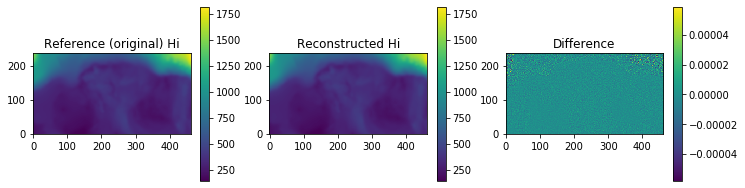

In [16]:
def intersectionsToMidpoints(a_i):
    return 0.25*(a_i[:-1, :-1] + a_i[:-1, 1:] + a_i[1:, :-1] + a_i[1:, 1:])

def midpointsToIntersections(a_m, border_size, smoothing_factor=0.4):
    from scipy import interpolate 
    from scipy.ndimage.filters import gaussian_filter
    
    # Coordinates to midpoints
    x_m = np.mgrid[0:a_m.shape[1]] + 0.5
    y_m = np.mgrid[0:a_m.shape[0]] + 0.5
    
    # Coordinates to intersections
    x_i = np.mgrid[1:a_m.shape[1]]
    y_i = np.mgrid[1:a_m.shape[0]]
    
    # Create interpolating function and create first guess
    a_i1f = interpolate.interp2d(x_m, y_m, a_m, kind='cubic')
    a_i1 = a_i1f(x_i, y_i)

    # Iteratively refine intersections estimate
    for i in range(border_size):
        delta = a_m[1:-1,1:-1] - intersectionsToMidpoints(a_i1)
        smooth_delta = gaussian_filter(delta, max(1, border_size-i-1))
        delta = (1.0-smoothing_factor)*delta + smoothing_factor*smooth_delta
        
        a_i1[:-1, :-1] += delta*0.25
        a_i1[1:, :-1] += delta*0.25
        a_i1[1:, 1:] += delta*0.25
        a_i1[:-1, 1:] += delta*0.25 
        
    return a_i1[border_size-1:-border_size+1,border_size-1:-border_size+1]




border_size = 19
h_i = H_full[y0:y1, x0:x1]
h_m = intersectionsToMidpoints(h_i)
h2 = midpointsToIntersections(h_m, border_size, smoothing_factor=0.4)

h = h_i[border_size:-border_size,border_size:-border_size]

plt.figure(figsize=(12, 8))
plt.subplot(1,3,1)
plt.title("Reference (original) Hi")
plt.imshow(h, origin='lower', interpolation='none')
plt.colorbar(shrink=0.4)

plt.subplot(1,3,2)
plt.title("Reconstructed Hi")
plt.imshow(h2, origin='lower', interpolation='none')
plt.colorbar(shrink=0.4)

plt.subplot(1,3,3)
plt.title("Difference")
plt.imshow(h - h2, origin='lower', interpolation='none')
plt.colorbar(shrink=0.4)

print(h_i.shape)
print(h_m.shape)
print(h.shape)
print(h2.shape)
print(np.max(h-h2))

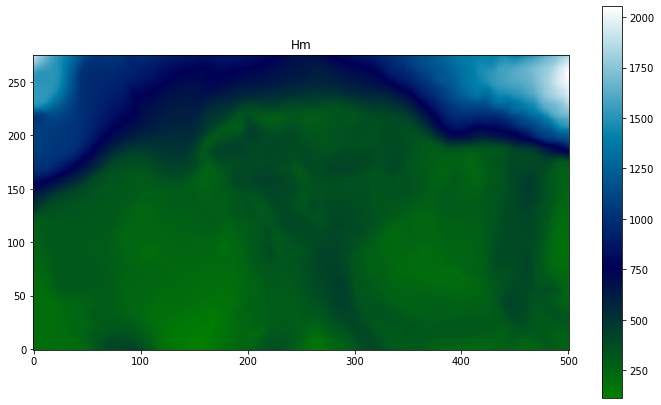

(276, 501)


In [17]:
border_size = 10

with Dataset(source_url) as ncfile:
    H_full = np.array(ncfile.variables['h'][y0-border_size:y1+border_size, x0-border_size:x1+border_size])
    
H_m = midpointsToIntersections(H_full, border_size)

fig = plt.figure(figsize=(12,8))
plt.imshow(H_m, interpolation="None", origin='lower', cmap='ocean')
plt.colorbar(shrink=0.9)
plt.title("Hm")
plt.show()

print(H_m.shape)

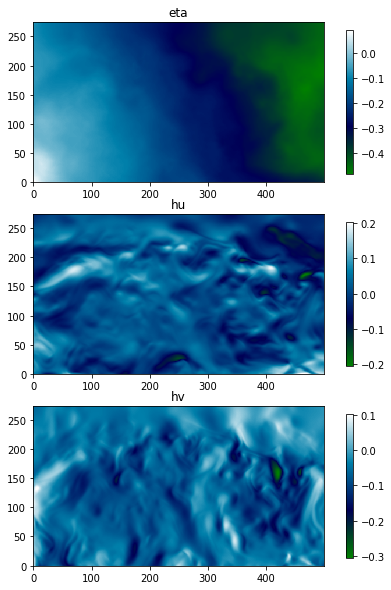

In [18]:
with Dataset(source_url) as ncfile:
    eta0 = np.array(ncfile.variables['zeta'][0, y0:y1, x0:x1])
    hu0 = np.array(ncfile.variables['ubar'][0, y0:y1, x0:x1])
    hv0 = np.array(ncfile.variables['vbar'][0, y0:y1, x0:x1])
    
plt.figure(figsize=(8, 10))
plt.subplot(3,1,1)
plt.title("eta")
plt.imshow(eta0, interpolation="None", origin='lower', cmap='ocean')
plt.colorbar(shrink=0.9)
plt.subplot(3,1,2)
plt.title("hu")
plt.imshow(hu0, interpolation="None", origin='lower', cmap='ocean')
plt.colorbar(shrink=0.9)
plt.subplot(3,1,3)
plt.title("hv")
plt.imshow(hv0, interpolation="None", origin='lower', cmap='ocean')
plt.colorbar(shrink=0.9)

In [19]:
timesteps = range(0, 5)

with Dataset(norkyst800_url) as ncfile:
    time = np.array(ncfile.variables['time'][timesteps])
    
print(time.shape)
t = time - time[0]
print(t)

(5,)
[    0.  3600.  7200. 10800. 14400.]


In [20]:
with Dataset(norkyst800_url) as ncfile:
    #Download full zeta (faster than downloading slices)
    zeta = ncfile.variables['zeta'][timesteps, y0-1:y1+1, x0-1:x1+1]
        
    eta_north = zeta[timesteps, -1, 1:-1]
    eta_south = zeta[timesteps, 0, 1:-1]
    eta_east = zeta[timesteps, 1:-1, -1]
    eta_west = zeta[timesteps, 1:-1, 0]
    
print(eta_north.shape)
print(eta_south.shape)
print(eta_east.shape)
print(eta_west.shape)

(5, 500)
(5, 500)
(5, 275)
(5, 275)


In [21]:
with Dataset(norkyst800_url) as ncfile:
    #Download full zeta (faster than downloading slices)
    ubar = ncfile.variables['ubar'][timesteps, y0-1:y1+1, x0-1:x1+1]
    
    hu_north = ubar[timesteps, -1, 1:-1]
    hu_south = ubar[timesteps, 0, 1:-1]
    hu_east = ubar[timesteps, 1:-1, -1]
    hu_west = ubar[timesteps, 1:-1, 0]
    
print(hu_north.shape)
print(hu_south.shape)
print(hu_east.shape)
print(hu_west.shape)

(5, 500)
(5, 500)
(5, 275)
(5, 275)


In [22]:
with Dataset(norkyst800_url) as ncfile:
    #Download full zeta (faster than downloading slices)
    vbar = ncfile.variables['vbar'][timesteps, y0-1:y1+1, x0-1:x1+1]
    
    hv_north = vbar[timesteps, -1, 1:-1]
    hv_south = vbar[timesteps, 0, 1:-1]
    hv_east = vbar[timesteps, 1:-1, -1]
    hv_west = vbar[timesteps, 1:-1, 0]
    
print(hv_north.shape)
print(hv_south.shape)
print(hv_east.shape)
print(hv_west.shape)

(5, 500)
(5, 500)
(5, 275)
(5, 275)


In [23]:
with Dataset(norkyst800_url) as ncfile:
    u_wind = ncfile.variables['Uwind'][timesteps, y0:y1, x0:x1]
    v_wind = ncfile.variables['Vwind'][timesteps, y0:y1, x0:x1]
print(u_wind.shape)
print(v_wind.shape)

(5, 275, 500)
(5, 275, 500)


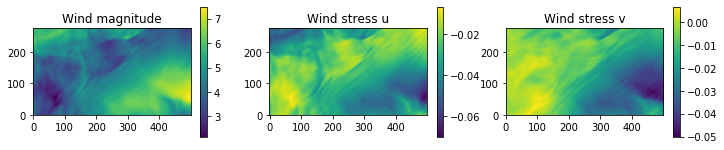

In [144]:
wind_speed = np.sqrt(np.power(u_wind, 2) + np.power(v_wind, 2))

# C_drag as defined by Engedahl (1995)
#(See "Documentation of simple ocean models for use in ensemble predictions. Part II: Benchmark cases"
#at https://www.met.no/publikasjoner/met-report/met-report-2012 for details.) /
C_drag = np.where(wind_speed < 11, 0.0012, 0.49 + 0.065*wind_speed)

rho_a = 1.225

#Wind stress is then 
# tau_s = rho_a * C_drag * |W|W
wind_stress = rho_a * C_drag * np.abs(wind_speed)
wind_stress_u = wind_stress*u_wind
wind_stress_v = wind_stress*v_wind

plt.figure(figsize=(12,8))
plt.subplot(1,3,1)
plt.title("Wind magnitude")
plt.imshow(wind_speed[4], origin='lower')
plt.colorbar(shrink=0.3)

plt.subplot(1,3,2)
plt.title("Wind stress u")
plt.imshow(wind_stress_u[4], origin='lower')
plt.colorbar(shrink=0.3)

plt.subplot(1,3,3)
plt.title("Wind stress v")
plt.imshow(wind_stress_v[4], origin='lower')
plt.colorbar(shrink=0.3)

In [145]:
wind_source = WindStress.WindStress(t=t, X=wind_stress_u, Y=wind_stress_v)

In [146]:
sponge_cells=[80, 80, 80, 80]
boundary_conditions = Common.BoundaryConditions(3,3,3,3, spongeCells=sponge_cells)

bc_north = Common.SingleBoundaryConditionData(eta_north, hu_north, hv_north);
bc_south = Common.SingleBoundaryConditionData(eta_south, hu_south, hv_south);
bc_east = Common.SingleBoundaryConditionData(eta_east, hu_east, hv_east);
bc_west = Common.SingleBoundaryConditionData(eta_west, hu_west, hv_west);
boundary_conditions_data = Common.BoundaryConditionsData(t, bc_north, bc_south, bc_east, bc_west)

In [134]:
with Dataset(norkyst800_url) as ncfile:
    x = ncfile.variables['X'][x0:x1]
    y = ncfile.variables['Y'][y0:y1]
    
nx = x1 - x0 - sponge_cells[1] - sponge_cells[3]
ny = y1 - y0 - sponge_cells[0] - sponge_cells[2]

dx = np.average(x[1:] - x[:-1])
dy = np.average(y[1:] - y[:-1])

print("Domain size: " + str([nx, ny]))
print("Cell size: " + str([dx, dy]))

Domain size: [340, 115]
Cell size: [800.0, 800.0]


In [135]:
with Dataset(source_url) as ncfile:
    angle = np.array(ncfile.variables['angle'][y0:y1, x0:x1])

(-0.45, 9.45, -0.25, 5.25)

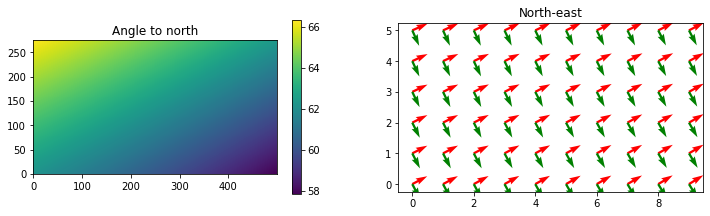

In [136]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title("Angle to north")
plt.imshow(angle*180/np.pi, origin='lower')
plt.colorbar(shrink=0.4)

plt.subplot(1,2,2)
plt.title("North-east")
plt.quiver(np.sin(angle[::50, ::50]), np.cos(angle[::50, ::50]), color='r')
plt.quiver(np.cos(angle[::50, ::50]), -np.sin(angle[::50, ::50]), color='g')
plt.axis('image')

In [137]:
with Dataset(source_url) as ncfile:
    lat = ncfile.variables["lat"][y0:y1, x0:x1]

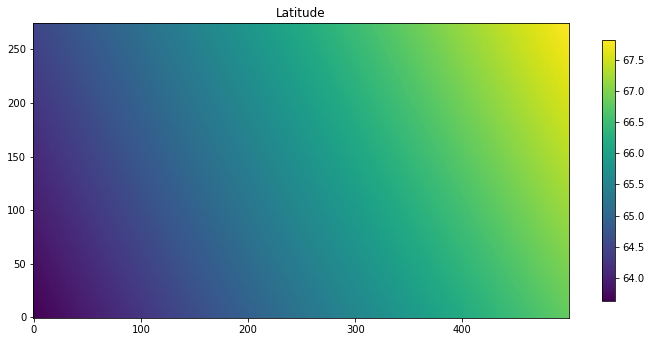

In [138]:
plt.figure(figsize=(12, 8))
plt.title("Latitude")
plt.imshow(lat, origin='lower')
plt.colorbar(shrink=0.6)

In [139]:
def calcCoriolisParams(lat):
    #https://en.wikipedia.org/wiki/Coriolis_frequency
    #https://en.wikipedia.org/wiki/Beta_plane
    #Earths rotation rate: 7.2921 × 10−5 rad/s
    omega = 7.2921*1.0e-5
    
    #f is the angular velocity or frequency required to maintain a body at a fixed circle of latitude or zonal region
    f = 2.0*omega*np.sin(lat)
    
    #beta is df/dy where y points north
    #earth mean radius =  6,371.0088 km
    a = 6371008.8
    beta = 2.0*omega*np.cos(lat) / a
    
    return [f, beta]

def degToRad(deg):
    return deg*np.pi/180

max_lat = np.max(lat)
min_lat = np.min(lat)
max_cor = calcCoriolisParams(degToRad(max_lat))
min_cor = calcCoriolisParams(degToRad(min_lat))
print("Max latitude: " + str(max_lat) + " => " + str(max_cor))
print("Min latitude: " + str(min_lat) + " => " + str(min_cor))

Max latitude: 67.81522476102649 => [0.00013504545569968562, 8.643713284329057e-12]
Min latitude: 63.63251319864073 => [0.00013066917144132905, 1.0166732841144548e-11]


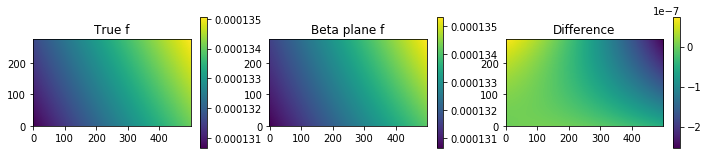

In [140]:
f_truth, _ = calcCoriolisParams(degToRad(lat))

#Calculate beta plane approximation
x_c, y_c = [0, 0]
f, beta = calcCoriolisParams(degToRad(lat[y_c, x_c]))
XX, YY = np.meshgrid(x, y)
XX = XX - XX[y_c, x_c]
YY = YY - YY[y_c, x_c]
local_lat = np.sin(angle)*XX + np.cos(angle)*YY
f_beta = f + beta*local_lat

plt.figure(figsize=(12, 8))
plt.subplot(1,3,1)
plt.title("True f")
plt.imshow(f_truth, origin='lower')#, vmin=-0.0002, vmax=0.0002)
plt.colorbar(shrink=0.3)


plt.subplot(1,3,2)
plt.title("Beta plane f")
plt.imshow(f_beta, origin='lower')#, vmin=-0.0002, vmax=0.0002)
plt.colorbar(shrink=0.3)

plt.subplot(1,3,3)
plt.title("Difference")
plt.imshow(f_truth-f_beta, origin='lower')#, vmin=-0.0001, vmax=0.0)
plt.colorbar(shrink=0.3)



In [141]:
f, beta = calcCoriolisParams(degToRad(lat[0, 0]))
print("F and beta are " + str([f, beta]))

F and beta are [0.00013066917144132905, 1.0166732841144548e-11]


In [147]:
import importlib 
importlib.reload(Common)
importlib.reload(CDKLM16)

# Set initial conditions 
sim_args = {
    "gpu_ctx": gpu_ctx,
    "nx": nx, "ny": ny,
    "dx": dx, "dy": dy,
    "dt": 1.0,
    "g": 9.81,
    "f": f,
    "coriolis_beta": beta,
    "r": 0.0,
    "rk_order": 2
}

data_args = {"H": H_m, 
             "eta0": eta0, 
             "hu0": hu0, 
             "hv0": hv0,
             "angle": angle,
             "boundary_conditions": boundary_conditions,
             "boundary_conditions_data": boundary_conditions_data,
             "wind_stress": wind_source
            }
sim = CDKLM16.CDKLM16(**sim_args, **data_args)
sim_animation(sim, 
              t_end=t[-1], T=150, 
              #t_end=300, T=30,
              h_max=0.7, h_min=-0.7, 
              uv_max=0.25, uv_min=-0.25, 
              interior_domain_only=False, 
              add_extra=True)

Animation.save using <class 'matplotlib.animation.HTMLWriter'>


self.interior_domain_indices: [-80 -80  80  80]
.......................................................................................................................................................